In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
data_path = './data/combined_data.csv'

## 读入数据

In [5]:
raw_data = pd.read_csv(data_path)
raw_data.head()

,WindNumber,Time,WindSpeed,Power,RotorSpeed,Width,RatedPower,CutInWindSpeed,CutOutWindSpeed,WheelSpeedMin,WheelSpesdMax
0,1,2017/11/1 0:20,4.188333,65.750000,5.779167,99.0,2000,3.0,25,8.33,16.8
1,1,2017/11/1 0:30,4.042500,120.700000,8.636500,99.0,2000,3.0,25,8.33,16.8
2,1,2017/11/1 0:40,4.137368,135.157895,8.668421,99.0,2000,3.0,25,8.33,16.8
3,1,2017/11/1 0:50,4.274737,157.315789,8.727895,99.0,2000,3.0,25,8.33,16.8
4,1,2017/11/1 1:00,4.108947,129.894737,8.656842,99.0,2000,3.0,25,8.33,16.8


In [6]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 497837 entries, 0 to 497836
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   WindNumber       497837 non-null  int64  
 1   Time             497837 non-null  object 
 2   WindSpeed        497837 non-null  float64
 3   Power            497837 non-null  float64
 4   RotorSpeed       497837 non-null  float64
 5   Width            497837 non-null  float64
 6   RatedPower       497837 non-null  int64  
 7   CutInWindSpeed   497837 non-null  float64
 8   CutOutWindSpeed  497837 non-null  int64  
 9   WheelSpeedMin    497837 non-null  float64
 10  WheelSpesdMax    497837 non-null  float64
dtypes: float64(7), int64(3), object(1)
memory usage: 41.8+ MB


### 设置待处理的部分数据

**！修改这里切换数据集！**

- 切入风速3m
- 切出风速25m

- 转速范围8.33-16.8

In [7]:
# width_99_data = raw_data[raw_data['Width']==99]
width_99_data = raw_data[raw_data['WindNumber']==1]

In [8]:
width_99_data.shape

(40727, 11)

In [9]:
set(width_99_data['WindNumber'].values)

{1}

In [10]:
cut_in_99 = 3
cut_out_99 = 25

### 处理小于切入风速，power小于0的值

In [11]:
def judge_power_min(row):
    if row['Power']<0:
        return 0
    elif row['Power']>=0 and row['WindSpeed']<cut_in_99:
        return 1
    else:
        return -1
width_99_data['res'] = width_99_data.apply(judge_power_min, axis=1)

In [12]:
np.sum(width_99_data['res']==0)

12909

### 处理大于切出风速数据

- 还不知道切出风速外的数据，看power如何

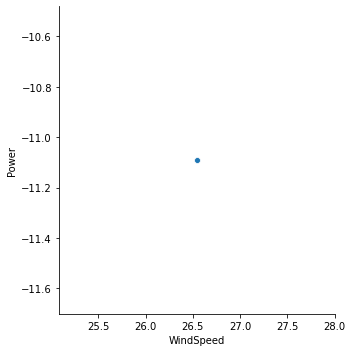

In [13]:
cut_out_data = width_99_data[width_99_data['WindSpeed']>cut_out_99]
sns.relplot(x='WindSpeed',y='Power',data=cut_out_data,kind='scatter')

- 全是负数，直接全部设置为0

In [14]:
width_99_data['res'][width_99_data['WindSpeed']>cut_out_99]

20121    0
Name: res, dtype: int64

In [15]:
np.sum(width_99_data['res']==0)

12909

## 定义四分位法

In [16]:
def get_mid(data):
    # data: series
    # idx在n为偶数时返回n/2
    x = data.sort_values()
    n = x.shape[0]
    idx = (n+1)/2 if n%2==1 else n/2
    idx = int(idx-1)
    mid = x.iloc[idx] if n%2==1 else (x.iloc[idx]+x.iloc[int((n+2)/2-1)])/2
    return idx, mid

def get_F(data):
    # data: series
    x = data.sort_values()
    n = x.shape[0]
    idx_2, q_2 = get_mid(x)
    k = n//4
    # print(k, n)
    if n%2==0:
        q_1_data = x.iloc[:idx_2] if idx_2%2 else x.iloc[:idx_2+1]
        q_3_data = x.iloc[idx_2+1:]
        idx_1, q_1 = get_mid(q_1_data)
        idx_3, q_3 = get_mid(q_3_data)
    elif n%4==3:
        q_1 = 0.75*x.iloc[k]+0.25*x.iloc[k+1]
        q_3 = 0.25*x.iloc[3*k]+0.75*x.iloc[3*k+2]
    elif n%4==1:
        q_1 = 0.25*x.iloc[k-1]+0.75*x.iloc[k]
        q_3 = 0.75*x.iloc[3*k]+0.25*x.iloc[3*k+1]
    i_qr = q_3-q_1
    f_1, f_u = q_1-1.5*i_qr, q_3+1.5*i_qr
    return f_1, f_u

### 横向四分位法

In [17]:
res_data = width_99_data[width_99_data['res']!=0]
res_data.shape

(27818, 12)

In [18]:
res_data.head()

,WindNumber,Time,WindSpeed,Power,RotorSpeed,Width,RatedPower,CutInWindSpeed,CutOutWindSpeed,WheelSpeedMin,WheelSpesdMax,res
0,1,2017/11/1 0:20,4.188333,65.750000,5.779167,99.0,2000,3.0,25,8.33,16.8,-1
1,1,2017/11/1 0:30,4.042500,120.700000,8.636500,99.0,2000,3.0,25,8.33,16.8,-1
2,1,2017/11/1 0:40,4.137368,135.157895,8.668421,99.0,2000,3.0,25,8.33,16.8,-1
3,1,2017/11/1 0:50,4.274737,157.315789,8.727895,99.0,2000,3.0,25,8.33,16.8,-1
4,1,2017/11/1 1:00,4.108947,129.894737,8.656842,99.0,2000,3.0,25,8.33,16.8,-1


- 按照power排序

In [19]:
res_data = res_data.sort_values(by=['Power'])

In [20]:
res_data.head()

,WindNumber,Time,WindSpeed,Power,RotorSpeed,Width,RatedPower,CutInWindSpeed,CutOutWindSpeed,WheelSpeedMin,WheelSpesdMax,res
10575,1,2018/2/2 16:50,0.000000,0.0,0.000000,99.0,2000,3.0,25,8.33,16.8,1
23027,1,2018/5/22 8:30,4.870000,0.0,0.040000,99.0,2000,3.0,25,8.33,16.8,-1
5218,1,2017/12/17 5:50,3.519286,0.0,5.100714,99.0,2000,3.0,25,8.33,16.8,-1
31666,1,2018/8/4 10:30,0.000000,0.0,0.000000,99.0,2000,3.0,25,8.33,16.8,1
34999,1,2018/9/6 11:10,6.820000,0.0,0.030000,99.0,2000,3.0,25,8.33,16.8,-1


- 以25kw为间隔，把数据分为80组

In [21]:
st = np.linspace(0, 2000, 81, dtype=int)

In [22]:
st

array([   0,   25,   50,   75,  100,  125,  150,  175,  200,  225,  250,
        275,  300,  325,  350,  375,  400,  425,  450,  475,  500,  525,
        550,  575,  600,  625,  650,  675,  700,  725,  750,  775,  800,
        825,  850,  875,  900,  925,  950,  975, 1000, 1025, 1050, 1075,
       1100, 1125, 1150, 1175, 1200, 1225, 1250, 1275, 1300, 1325, 1350,
       1375, 1400, 1425, 1450, 1475, 1500, 1525, 1550, 1575, 1600, 1625,
       1650, 1675, 1700, 1725, 1750, 1775, 1800, 1825, 1850, 1875, 1900,
       1925, 1950, 1975, 2000])

In [23]:
# 超过[F1, Fu]的都算作异常
for i in range(1, st.shape[0]):
    p_min, p_max = st[i-1], st[i]
    flag = (res_data['Power']>=p_min) & (res_data['Power']<=p_max)
    sub_data = res_data[flag]
    f_1, f_u = get_F(sub_data['WindSpeed'])
    flag_1_u = (res_data['WindSpeed']<f_1) | (res_data['WindSpeed']>f_u)
    flag_com = flag & flag_1_u
    res_data['res'][flag_com]=0

In [24]:
np.sum(res_data['res']==0)

1344

- 设置原数据标记为0

In [25]:
width_99_data['res'][res_data[res_data['res']==0].index]=0
np.sum(width_99_data['res']==0)

14253

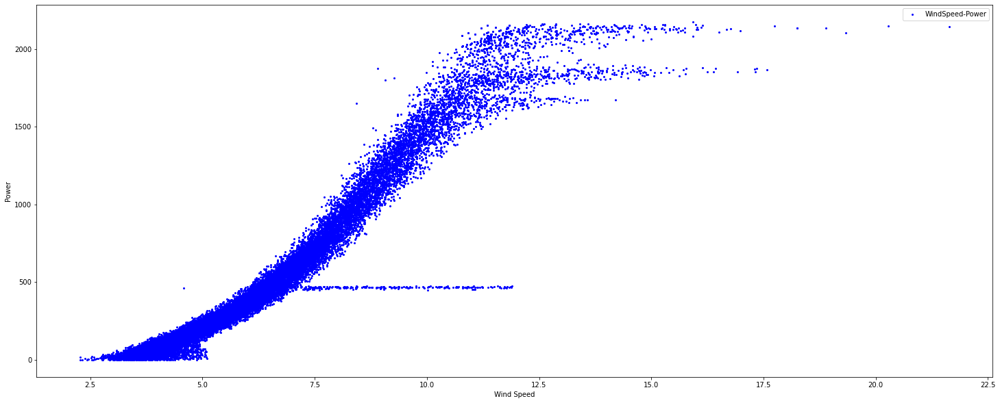

In [26]:
plt.figure(figsize=(25,10))
g_data = width_99_data[width_99_data['res']!=0]
plt.plot(g_data['WindSpeed'], g_data['Power'], '.b', ms=4, label='WindSpeed-Power')
plt.legend()
plt.xlabel('Wind Speed')
plt.ylabel('Power')
plt.show()

### 纵向四分位法

In [27]:
res_data = width_99_data[width_99_data['res']!=0]
print(res_data.shape)

(26474, 12)


In [28]:
res_data = res_data.sort_values(by=['Power'])

In [29]:
res_data.head()

,WindNumber,Time,WindSpeed,Power,RotorSpeed,Width,RatedPower,CutInWindSpeed,CutOutWindSpeed,WheelSpeedMin,WheelSpesdMax,res
5218,1,2017/12/17 5:50,3.519286,0.000000,5.100714,99.0,2000,3.0,25,8.33,16.8,-1
38396,1,2018/10/11 15:00,2.433750,0.000000,3.395000,99.0,2000,3.0,25,8.33,16.8,1
23027,1,2018/5/22 8:30,4.870000,0.000000,0.040000,99.0,2000,3.0,25,8.33,16.8,-1
6710,1,2017/12/29 19:50,3.140000,0.100000,4.302000,99.0,2000,3.0,25,8.33,16.8,-1
30972,1,2018/7/29 10:40,3.981111,0.111111,4.098889,99.0,2000,3.0,25,8.33,16.8,-1


In [30]:
st = np.arange(0, 25.5, 0.5)

In [31]:
# 超过[F1, Fu]的都算作异常
for i in range(1, st.shape[0]):
    p_min, p_max = st[i-1], st[i]
    flag = (res_data['WindSpeed']>=p_min) & (res_data['WindSpeed']<=p_max)
    sub_data = res_data[flag]
    # print(sub_data)
    if sub_data.shape[0]<4:
        continue
    f_1, f_u = get_F(sub_data['Power'])
    flag_1_u = (res_data['Power']<f_1) | (res_data['Power']>f_u)
    flag_com = flag & flag_1_u
    res_data['res'][flag_com]=0

In [32]:
np.sum(res_data['res']==0)

592

In [33]:
width_99_data['res'][res_data[res_data['res']==0].index]=0
np.sum(width_99_data['res']==0)

14845

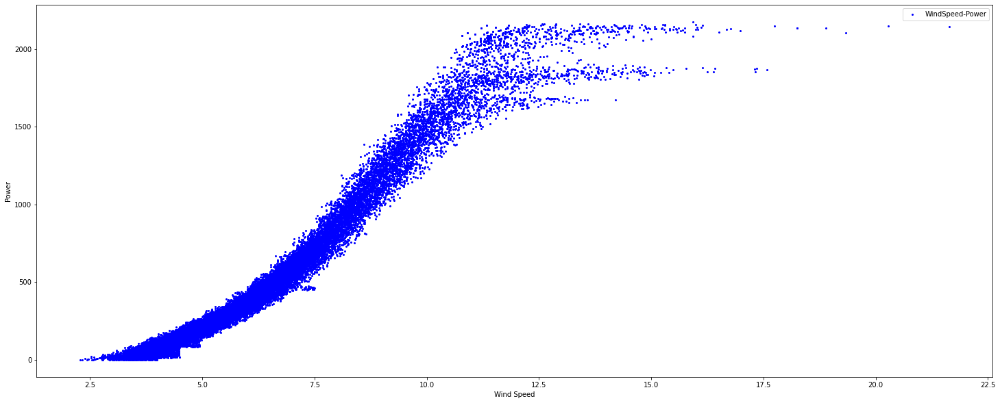

In [34]:
plt.figure(figsize=(25,10))
g_data = width_99_data[width_99_data['res']!=0]
plt.plot(g_data['WindSpeed'], g_data['Power'], '.b', ms=4, label='WindSpeed-Power')
plt.legend()
plt.xlabel('Wind Speed')
plt.ylabel('Power')
plt.show()

- 风电机1号数据中，居然直接把中间横线去掉了..

## 使用聚类

In [35]:
from sklearn.cluster import KMeans
# 用于计算距离
from scipy.spatial.distance import cdist
from sklearn import metrics

- 确定使用聚类的数据

In [36]:
train_data = width_99_data[['WindSpeed', 'Power']][width_99_data['res']!=0]

In [37]:
train_data.shape

(25882, 2)

### 使用肘部法确定K值

Text(0, 0.5, 'Average distortion')

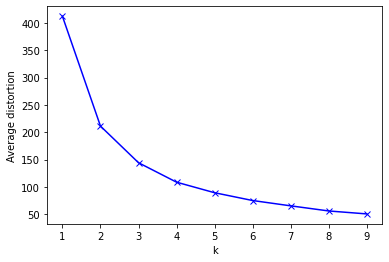

In [40]:
K=range(1,10)
meandistortions=[]
for k in K:
    kmeans=KMeans(n_clusters=k)
    kmeans.fit(train_data)
    # 计算的返回是[N, K]，每行是每个数据和中心的距离
    meandistortions.append(sum(np.min(
            cdist(train_data,kmeans.cluster_centers_,
                 'euclidean'),axis=1))/train_data.shape[0])
plt.plot(K,meandistortions,'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')

- 下降幅度最大的位置是2,所以设置为2类

- 直接用好几组数据太慢了，尽量一个个来
- 尝试使用循环测试不同K值下的轮廓系数，但是太，太慢了...

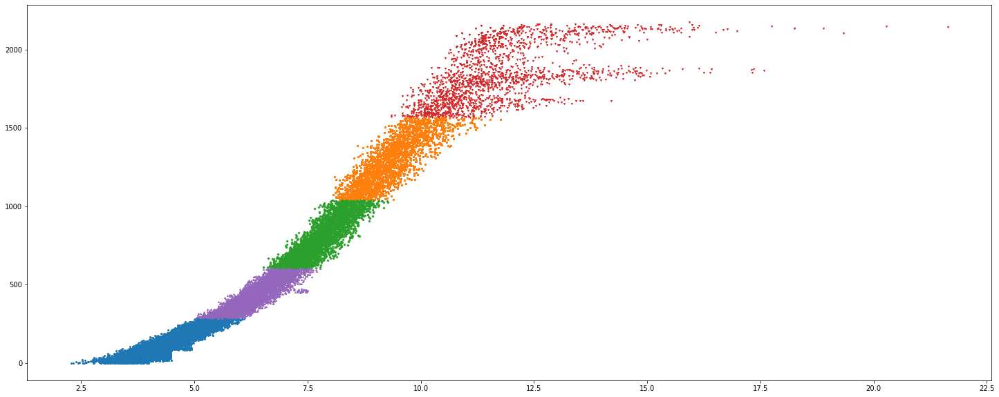

In [44]:
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', 'b']
colors_ = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
markers = ['o', 's', 'D', 'v', '^', 'p', '*', '+', 'x']
tests=[2,3,4,5,8,9]
subplot_counter=1

t=5
subplot_counter+=1
plt.figure(figsize=(25,10))
kmeans_model=KMeans(n_clusters=t).fit(train_data)

for i,l in enumerate(kmeans_model.labels_):
    plt.plot(train_data.iloc[i,0], train_data.iloc[i, 1], color=colors_[l],marker=markers[l],ls='None', ms=2)
    # plt.title(u'K = %s, Contour factor = %.03f' % 
    #               (t, metrics.silhouette_score
    #                (train_data, kmeans_model.labels_,metric='euclidean')))

- 效果很垃圾，`K=2`的时候也差不多的样子，考虑使用特征转换，或者进行升维